In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import rasterio as rio
from rasterio import features
from pathlib import Path
import pathlib
import geopandas as gpd
from descartes import PolygonPatch
from PIL import Image
import itertools
import re

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils


# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%matplotlib inline 

In [3]:
mpl.rcParams['figure.dpi'] = 300 #increase plot resolution
mpl.rcParams['figure.dpi']

300.0

## Input Paths

In [4]:
train_dir = Path('/home/data/train/')
test_dir = Path('/home/data/test_public/')
sample_dir = Path('/home/data/sample/')

## Output Paths

In [5]:
output_path = Path.cwd().parent / 'data'
output_csv_path = output_path/'output_csvs/'
Path(output_csv_path).mkdir(parents=True, exist_ok=True)

## Test Path and GeoDataFrame

In [6]:
test_raster_path = Path('/home/data/sample/L15-0506E-1204N_2027_3374_13/images_masked/global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13.tif')
test_raster_path_24 = Path('/home/data/sample/L15-0506E-1204N_2027_3374_13/images_masked/global_monthly_2019_12_mosaic_L15-0506E-1204N_2027_3374_13.tif')
test_geojson_path = Path('/home/data/sample/L15-0506E-1204N_2027_3374_13/labels_match_pix/global_monthly_2018_01_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson')
test_geojson_path_24 = Path('/home/data/sample/L15-0506E-1204N_2027_3374_13/labels_match_pix/global_monthly_2019_12_mosaic_L15-0506E-1204N_2027_3374_13_Buildings.geojson')
test_gdf = gpd.read_file(test_geojson_path)
test_gdf_24 = gpd.read_file(test_geojson_path_24)

In [7]:
test_gdf.set_index('Id',inplace=True)
test_gdf_24.set_index('Id',inplace=True)

test_gdf.sort_index(inplace=True)
test_gdf_24.sort_index(inplace=True)

## Plotting GeoDataFrame Polygons

In [8]:
def plot_gdf(gdf,fill=False,ax=None,linewidth=0.2):
    if ax is None:
        _,ax = plt.subplots(1,figsize=(3, 3))
        
    for geom in gdf['geometry']:
        if fill:
            patch = PolygonPatch(geom,linewidth=linewidth,color='fuchsia')
            ax.add_patch(patch)
        else:
            ax.plot(*geom.exterior.xy,linewidth=linewidth)
    return(ax)

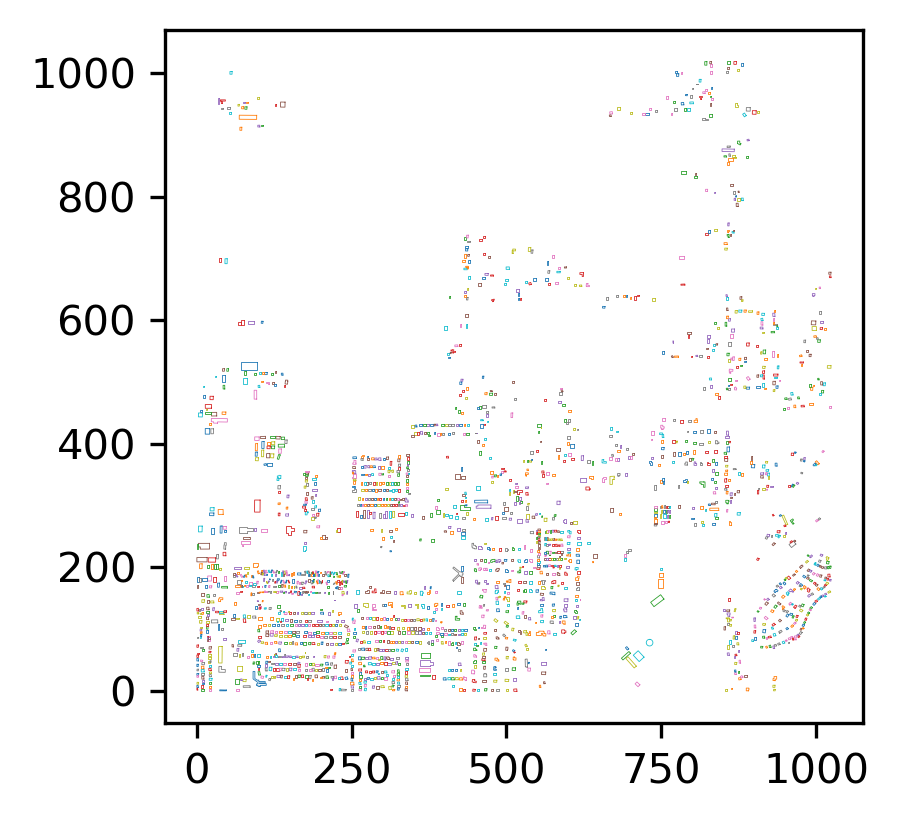

In [9]:
plot_gdf(test_gdf);

### Plotting Satellite Image

In [10]:
def plot_sat(path,gdf=None, fill=False,linewidth=0.2):
    f, ax = plt.subplots(1,figsize=(3, 3))
    f.tight_layout()
    
    r = rio.open(path)
    r = r.read()
    r = r.transpose((1,2,0,))
    ax.imshow(r)
    
    if gdf is not None:
        plot_gdf(gdf,fill=fill,ax=ax,linewidth=linewidth)
        
    return(ax)

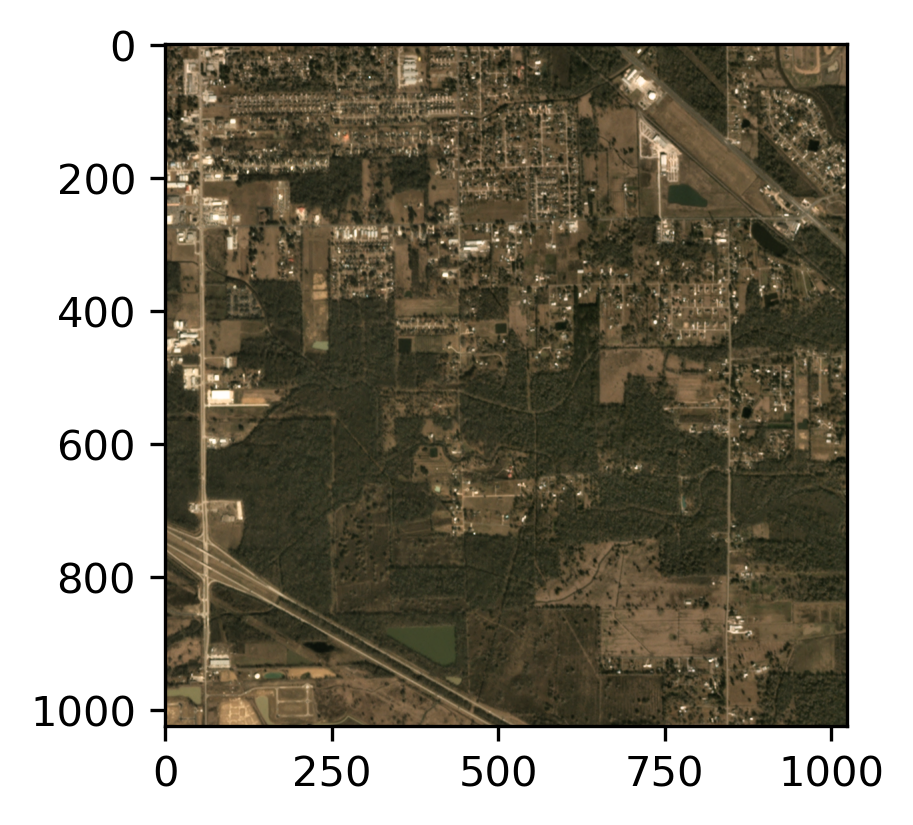

In [11]:
plot_sat(path=test_raster_path);

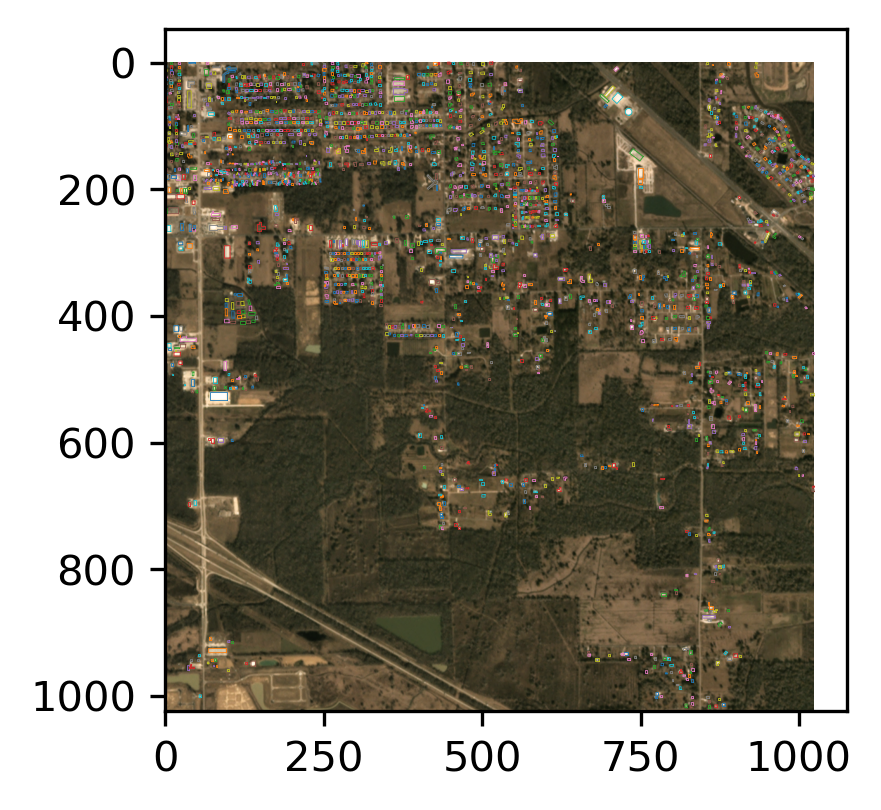

In [12]:
plot_sat(path=test_raster_path,gdf=test_gdf);

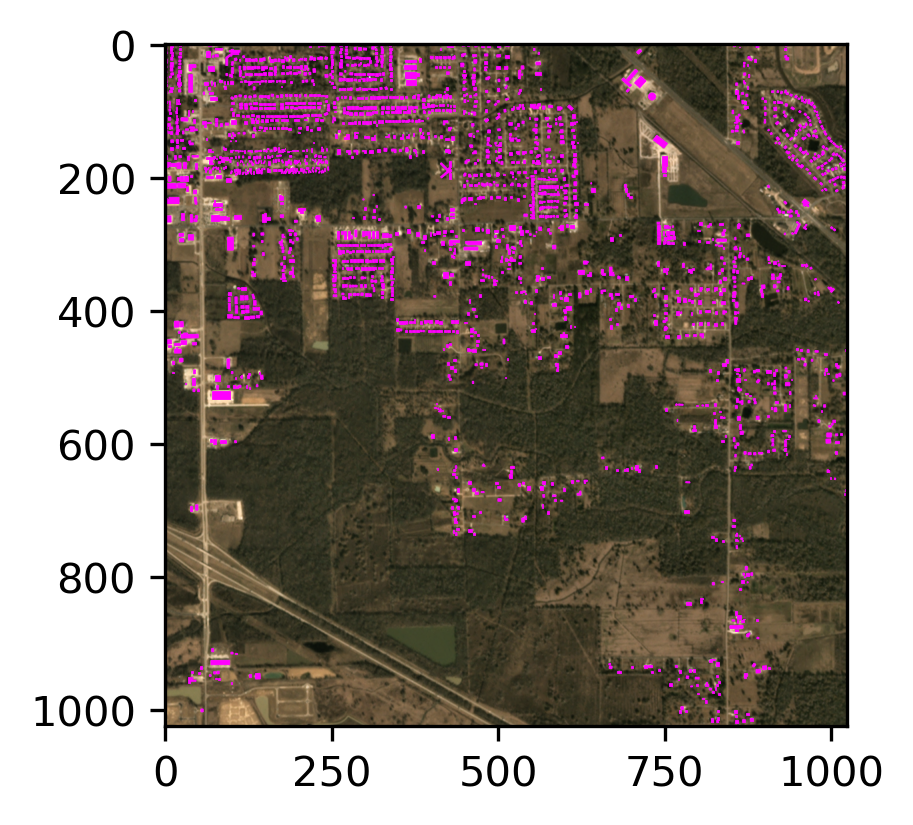

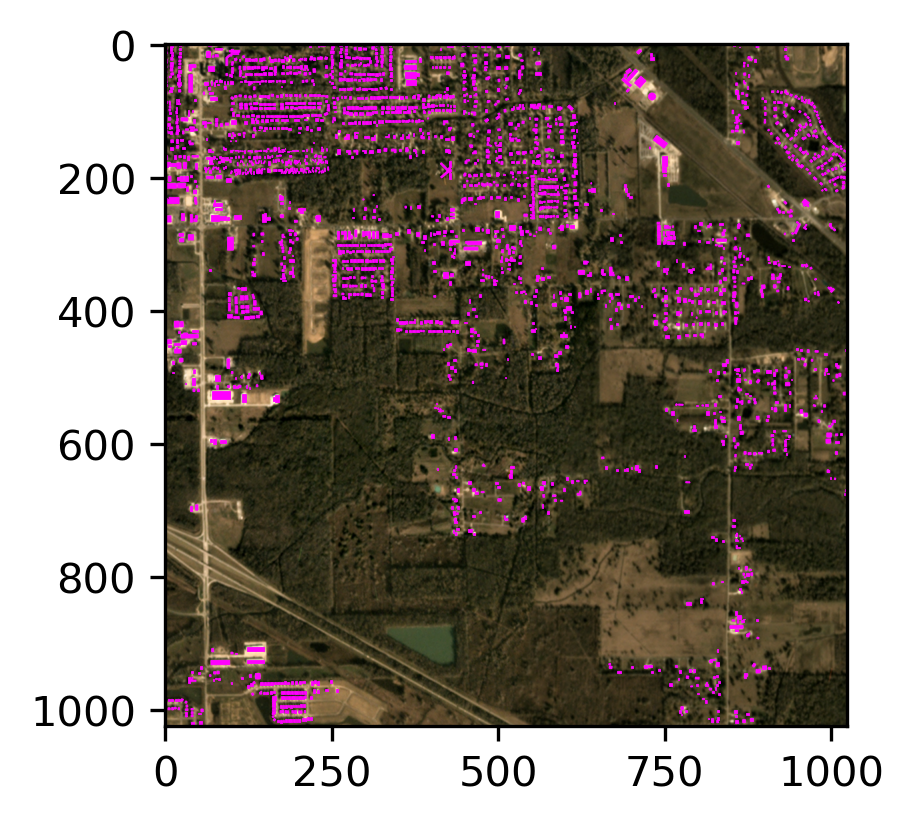

In [13]:
plot_sat(path=test_raster_path,gdf=test_gdf,fill=True);
plot_sat(path=test_raster_path_24,gdf=test_gdf_24,fill=True);

## Rasterizing Polygons

In [14]:
def rasterize_geojson(geojson_path,reference_raster_path):
    gdf = gpd.read_file(geojson_path)
    with rio.open(reference_raster_path) as raster:
        r = raster.read(1)
        
        mask = image = features.rasterize(((polygon, 255) for polygon in gdf['geometry']),out_shape=r.shape)
        
    return mask

In [15]:
def rasterize_gdf(gdf,reference_raster_path):
    
    with rio.open(reference_raster_path) as raster:
        r = raster.read(1)
        
        mask = image = features.rasterize(((polygon, 255) for polygon in gdf['geometry']),out_shape=r.shape)
        
    return mask

In [16]:
test_mask = rasterize_geojson(test_geojson_path,test_raster_path)
test_mask_24 = rasterize_geojson(test_geojson_path_24,test_raster_path_24)

In [17]:
np.unique(test_mask)

array([  0, 255], dtype=uint8)

In [18]:
test_mask_24.shape

(1024, 1024)

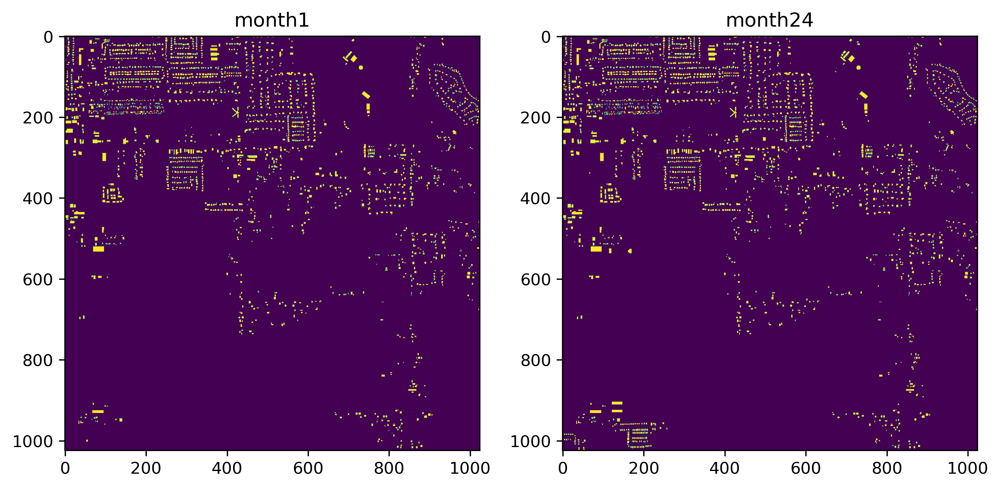

In [19]:
mpl.rcParams['figure.dpi'] = 300
_,axs = plt.subplots(1,2,figsize=(10,10))

masks = [test_mask,test_mask_24]
titles = ['month1','month24']

for i,ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.imshow(masks[i]);

### Getting the Differences between 2 Geodataframes

In [20]:
def gdf_difference(gdf1, gdf2, get_dates=False):
    try:
        gdf1.reset_index(inplace=True,drop=True)
    except:
        pass
    try:
        gdf2.reset_index(inplace=True,drop=True)
    except:
        pass
    
    
    len_1 = len(gdf1)
    len_2 = len(gdf2)
    
    len_diff = abs(len_2-len_1)
    
    if len_2 > len_1:
        start_index = len_2-len_diff
        diff_gdf = gdf2[start_index:].copy()
    else:
        start_index = len_1-len_diff
        diff_gdf = gdf1[start_index:].copy()

    diff_gdf.reset_index(inplace=True,drop=True)
        
    return diff_gdf

In [22]:
diff_gdf = gdf_difference(test_gdf,test_gdf_24)
diff_gdf

,area,iou_score,image_fname,geometry
0,146.169647,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((685.66539 297.44313, 683.67159 297.4..."
1,128.808502,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((863.51761 756.55759, 860.96997 756.5..."
2,115.927651,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((118.54870 138.64510, 116.55490 138.6..."
3,114.247540,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((716.19779 394.12868, 714.31475 394.1..."
4,94.086210,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((751.68239 369.44154, 750.13166 369.4..."
...,...,...,...,...
197,158.770479,1.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((195.80273 1003.70113, 193.80892 1003..."
198,349.463064,0.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((230.32607 974.79249, 227.44614 974.7..."
199,276.098223,0.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((243.61809 970.69412, 239.85202 970.6..."
200,263.217372,0.0,global_monthly_2019_12_mosaic_L15-0506E-1204N_...,"POLYGON ((258.79314 973.13099, 256.57780 973.1..."


In [23]:
test_mask_diff = rasterize_gdf(diff_gdf,test_raster_path)

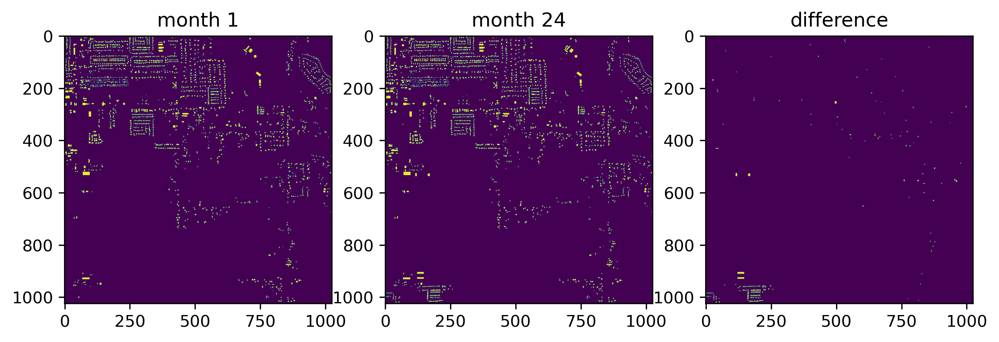

In [24]:
mpl.rcParams['figure.dpi'] = 300
_,axs = plt.subplots(1,3,figsize=(10,10))

masks = [test_mask,test_mask_24,test_mask_diff]
titles = ['month 1', 'month 24', 'difference']

for i,ax in enumerate(axs):
    ax.set_title(titles[i])
    ax.imshow(masks[i]);

### Creating Chips from our Satellite Imagery

In [25]:
class chip_creator():   
    def __init__(self, chip_dimension=256,raster=False):  
        self.chip_dimension = chip_dimension
        self.raster = raster
        
    def create_chips(self,image):
        np_array = self.__read_image(image)
        # get number of chips per colomn
        n_rows = (np_array.shape[0] - 1) // self.chip_dimension + 1
        # get number of chips per row
        n_cols = (np_array.shape[1] - 1) // self.chip_dimension + 1
        # segment image into chips and return list of chips
        l = []

        for r in range(n_rows):
            for c in range(n_cols):
                start_r_idx = r*self.chip_dimension
                end_r_idx = start_r_idx + self.chip_dimension

                start_c_idx = c*self.chip_dimension
                end_c_idx = start_c_idx + self.chip_dimension
                chip = np_array[start_r_idx:end_r_idx,start_c_idx:end_c_idx]
                if self.raster:
                   chip = np.moveaxis(chip,-1,0)

                l.append(chip)

        return np.array(l)
    
    def __read_image(self,image):
        # check whether image is a path or array
        if isinstance(image,(pathlib.PurePath,str)):
                with Image.open(image) as img:
                    # convert image into np array
                    np_array = np.array(img)
                return np_array
            
        elif isinstance(image,np.ndarray):
            return image
        else:
            raise ValueError(f"Expected Path or Numpy array received: {type(image)}")

In [26]:
chips_256 = chip_creator(raster=True)

In [27]:
chips_256.create_chips(test_raster_path)[0].shape

(4, 256, 256)

In [28]:
chips_256.raster=False

In [29]:
chips_256.create_chips(test_raster_path)[0].shape

(256, 256, 4)

In [30]:
def multiplot_images(list_of_images,ncols=4,dpi=300, raster=False):
    mpl.rcParams['figure.dpi'] = dpi
    nrows = (len(list_of_images) - 1) // ncols + 1
    fig,axs = plt.subplots(nrows,ncols,figsize=(10,10))
    
    fig.tight_layout()
    
    for r,ax in enumerate(axs):
        for c,row in enumerate(ax):
            # get the current index of the image
            i = r*ncols + c
            ax[c].set_title(i)
            image = list_of_images[i]
            # if the image is presented in raster format then move the channel axis
            if raster:
                image = np.moveaxis(image,0,-1)
            ax[c].imshow(image);


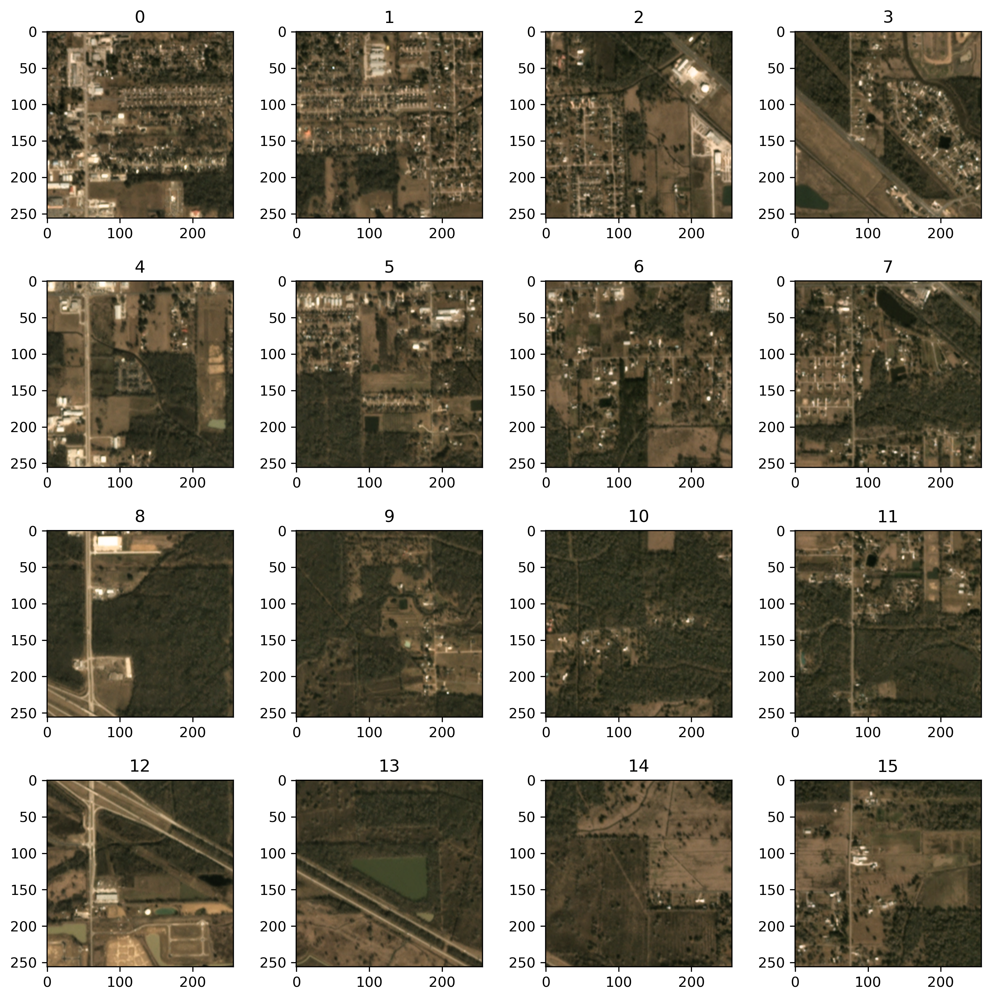

In [31]:
multiplot_images(chips_256.create_chips(test_raster_path));

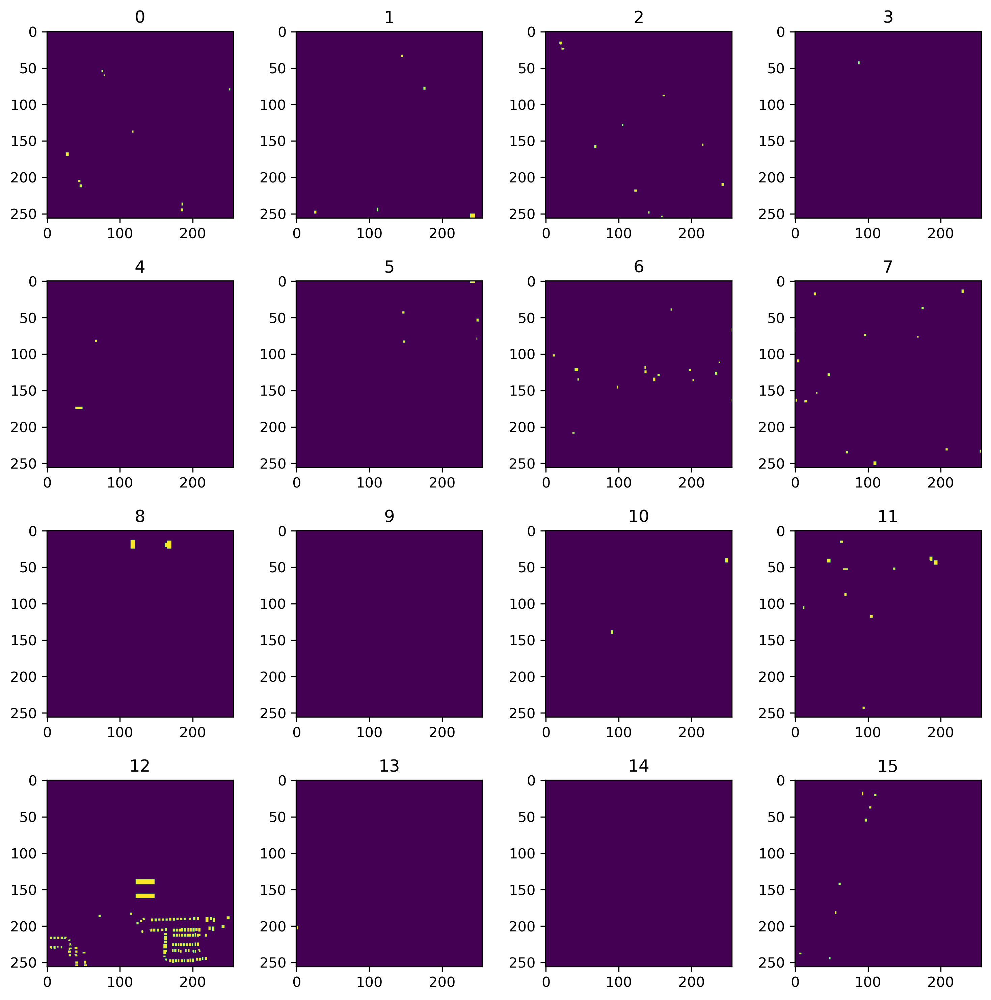

In [32]:
multiplot_images(chips_256.create_chips(test_mask_diff));